<a href="https://colab.research.google.com/github/hedzd/HepaticVessel/blob/main/HepaticVessels_preprocess.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image segmentation for hepatic vessels tumors

About the dataset:
This liver dataset was comprised of patients
with a variety of primary and metastatic liver tumours (cholangiocarcinoma,
hepatocellular carcinoma, metastases, etc.) 
Four hundred and forty-three portal venous phase CT scans were obtained
The liver vessels were semi-automatically
segmented. Contours were manually adjusted by an expert abdominal radiologist.

Get the dataset
http://medicaldecathlon.com/

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Extract .tar data into a folder named hepaticData

In [ ]:
!mkdir HepaticData

In [ ]:
!tar -xvf  '/content/drive/MyDrive/Task08_HepaticVessel.tar' -C 'HepaticData'

./._Task08_HepaticVessel
Task08_HepaticVessel/
Task08_HepaticVessel/._labelsTr
Task08_HepaticVessel/labelsTr/
Task08_HepaticVessel/._imagesTr
Task08_HepaticVessel/imagesTr/
Task08_HepaticVessel/._imagesTs
Task08_HepaticVessel/imagesTs/
Task08_HepaticVessel/._dataset.json
Task08_HepaticVessel/dataset.json
Task08_HepaticVessel/imagesTs/._hepaticvessel_306.nii.gz
Task08_HepaticVessel/imagesTs/hepaticvessel_306.nii.gz
Task08_HepaticVessel/imagesTs/._hepaticvessel_457.nii.gz
Task08_HepaticVessel/imagesTs/hepaticvessel_457.nii.gz
Task08_HepaticVessel/imagesTs/._hepaticvessel_365.nii.gz
Task08_HepaticVessel/imagesTs/hepaticvessel_365.nii.gz
Task08_HepaticVessel/imagesTs/._hepaticvessel_426.nii.gz
Task08_HepaticVessel/imagesTs/hepaticvessel_426.nii.gz
Task08_HepaticVessel/imagesTs/._hepaticvessel_377.nii.gz
Task08_HepaticVessel/imagesTs/hepaticvessel_377.nii.gz
Task08_HepaticVessel/imagesTs/._hepaticvessel_277.nii.gz
Task08_HepaticVessel/imagesTs/hepaticvessel_277.nii.gz
Task08_HepaticVessel/i

### Opening json file to get more info about dataset

In [ ]:
import json
with open('HepaticData/Task08_HepaticVessel/dataset.json') as json_file:     
  json_data = json.load(json_file)

In [ ]:
json_data

{'description': 'Hepatic Vessels and Tumour Segmentation',
 'labels': {'0': 'background', '1': 'Vessel', '2': 'Tumour'},
 'licence': 'CC-BY-SA 4.0',
 'modality': {'0': 'CT'},
 'name': 'HepaticVessel',
 'numTest': 140,
 'numTraining': 303,
 'reference': 'Memorial Sloan Kettering Cancer Center',
 'release': '1.1 14/08/2018',
 'tensorImageSize': '3D',
 'test': ['./imagesTs/hepaticvessel_003.nii.gz',
  './imagesTs/hepaticvessel_009.nii.gz',
  './imagesTs/hepaticvessel_012.nii.gz',
  './imagesTs/hepaticvessel_014.nii.gz',
  './imagesTs/hepaticvessel_015.nii.gz',
  './imagesTs/hepaticvessel_017.nii.gz',
  './imagesTs/hepaticvessel_021.nii.gz',
  './imagesTs/hepaticvessel_024.nii.gz',
  './imagesTs/hepaticvessel_034.nii.gz',
  './imagesTs/hepaticvessel_035.nii.gz',
  './imagesTs/hepaticvessel_036.nii.gz',
  './imagesTs/hepaticvessel_037.nii.gz',
  './imagesTs/hepaticvessel_038.nii.gz',
  './imagesTs/hepaticvessel_041.nii.gz',
  './imagesTs/hepaticvessel_043.nii.gz',
  './imagesTs/hepaticvesse

In [ ]:
from pathlib import Path
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cv2

### Checking size and number of data

In [ ]:
def checkShapeAndCount(path):
  pathlist = Path(path).glob('hepaticvessel_*.gz')
  count = 0
  for filename in pathlist:
    count = count + 1
    nifData  = nib.load(filename)
    imgData = nifData.get_fdata()
    if imgData.shape[0] != 512 and imgData.shape[1] != 512: #check if all samples are 512*512
      print("image shape: " ,dataTr.shape)
      print(filename)
  return count

In [ ]:
imageTrPath = 'HepaticData/Task08_HepaticVessel/imagesTr'
labelTrPath = 'HepaticData/Task08_HepaticVessel/labelsTr'

In [ ]:
numberOfTrainImages = checkShapeAndCount(imageTrPath)
print("Number of train images in dataset: ", numberOfTrainImages)
numberOfTrainLabels = checkShapeAndCount(labelTrPath)
print("Number of train labels in dataset: ", numberOfTrainLabels)
imageTsPath = 'HepaticData/Task08_HepaticVessel/imagesTs'
numberOfTestImages = checkShapeAndCount(imageTsPath)
print("Number of test images in dataset: ", numberOfTestImages)

Number of train images in dataset:  303
Number of train labels in dataset:  303
Number of test images in dataset:  140


### Plot one sample data with overlay mask

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app


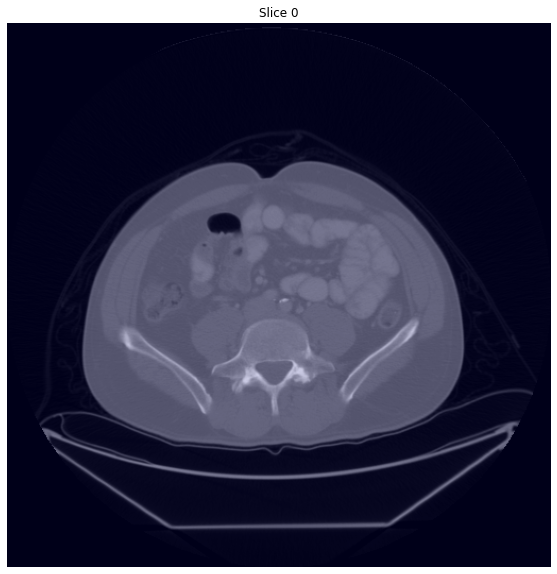

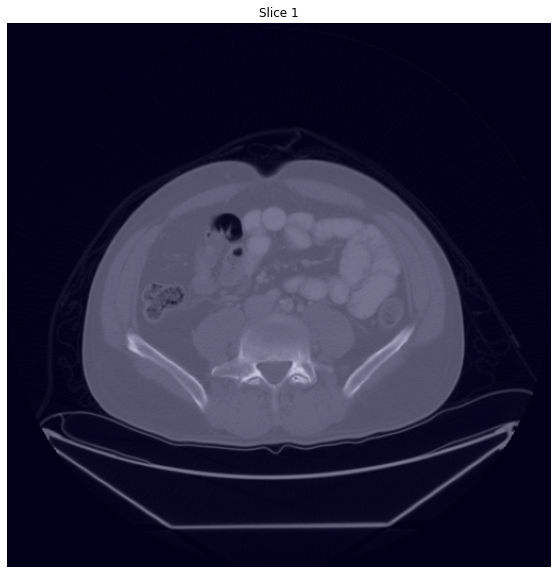

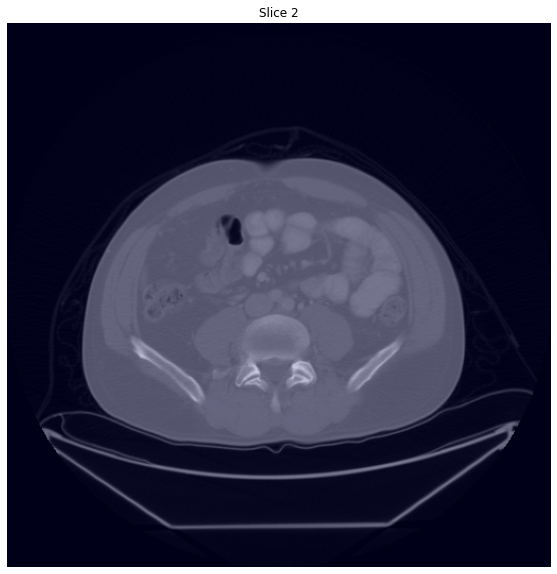

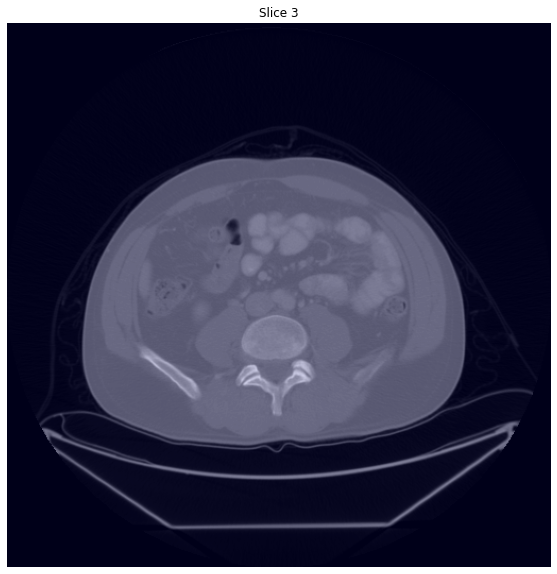

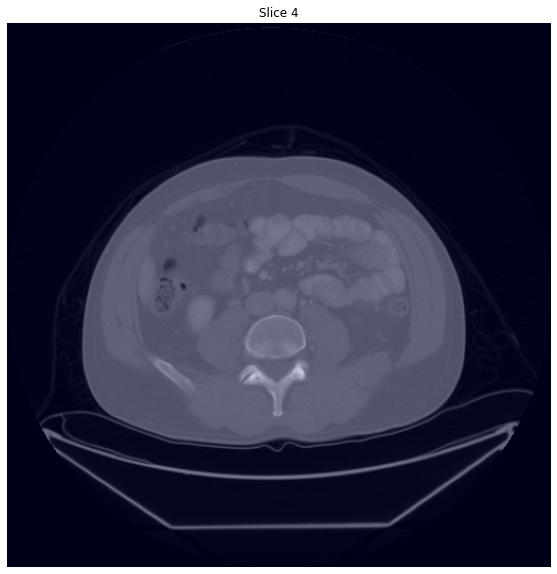

...

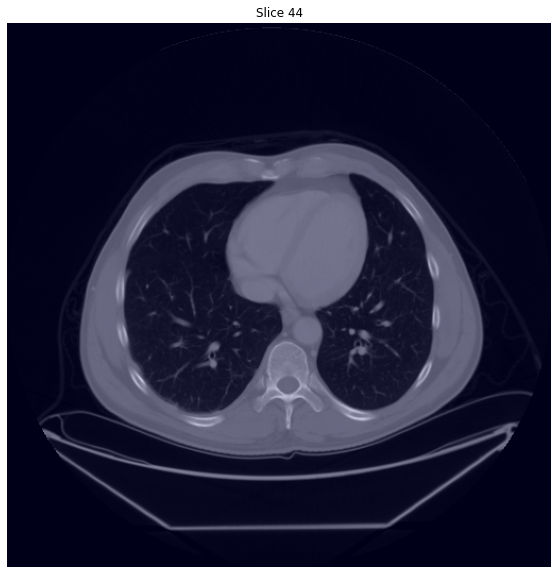

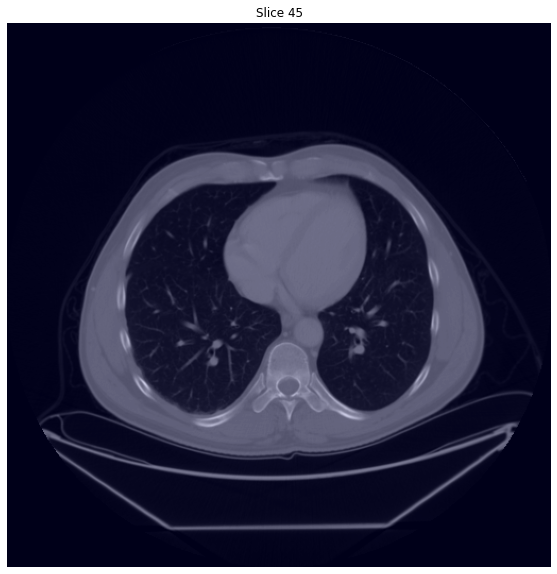

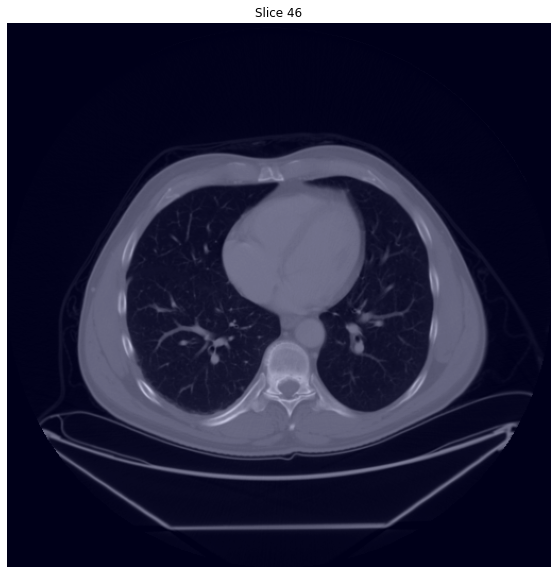

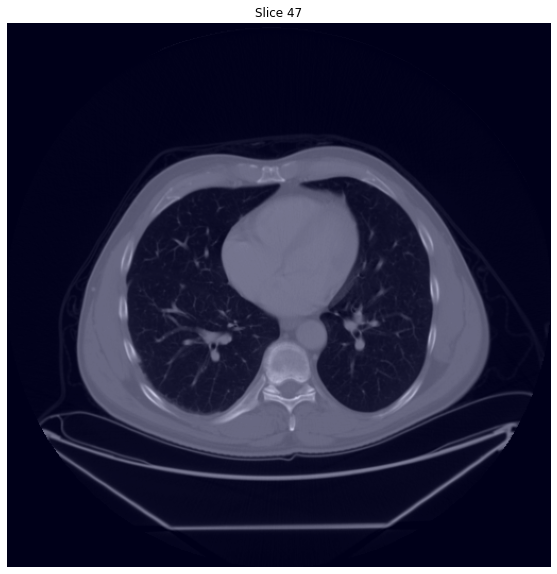

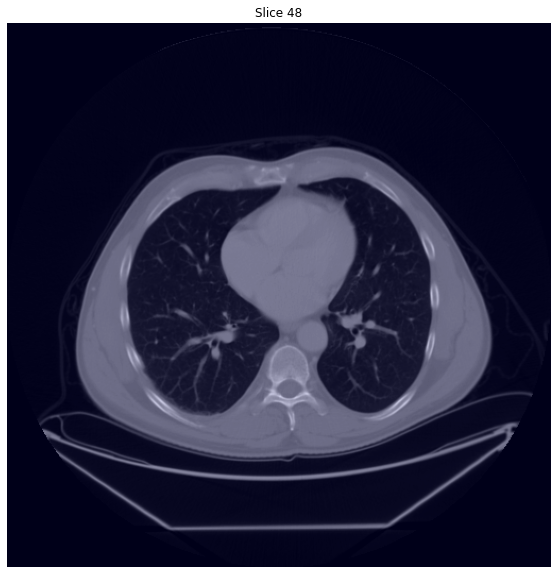

In [ ]:
train_image_example = 'HepaticData/Task08_HepaticVessel/imagesTr/hepaticvessel_001.nii.gz'
train_lable_example = 'HepaticData/Task08_HepaticVessel/labelsTr/hepaticvessel_001.nii.gz'

img1  = nib.load(train_image_example)
nii_data1 = img1.get_fdata()

label1  = nib.load(train_lable_example)
nii_label1 = label1.get_fdata()

for slice_Number in range(nii_data1.shape[2]):
  nii_data1[:,:,slice_Number] = np.flip(nii_data1[:,:,slice_Number].T)
  nii_label1[:,:,slice_Number] = np.flip(nii_label1[:,:,slice_Number].T) 

for slice_Number in range(nii_data1.shape[2]):
    fig = plt.figure(figsize=(10, 10)) 

    plt.imshow(nii_data1[:,:,slice_Number], cmap="gray") 
    plt.title("Slice "+str(slice_Number)) 
      
    plt.imshow(nii_label1[:,:,slice_Number], cmap="jet", alpha=0.2) 
    plt.axis('off') 

    fig.show()

### Trying to do some statistical preprocess

In [ ]:
def rowColSliceMinMax():
  rowColMinMax_vessel = [np.inf, 0, np.inf, 0, np.inf, 0] #minRow, maxRow, minCol, maxCol, minSlice, maxSlice
  rowColMinMax_tumour = [np.inf, 0, np.inf, 0, np.inf, 0]
  vList = []
  tList = []
  pathlist = Path(labelTrPath).glob('hepaticvessel_*.gz')
  for filename in pathlist:
    nifData  = nib.load(filename)
    imgData = nifData.get_fdata()
    resultV = np.where(imgData == 1)
    resultT = np.where(imgData == 2)
    vList.append([min(resultV[0]),max(resultV[0]),min(resultV[1]),max(resultV[1]),min(resultV[2]),max(resultV[2])])
    tList.append([min(resultT[0]),max(resultT[0]),min(resultT[1]),max(resultT[1]),min(resultT[2]),max(resultT[2])])
    if rowColMinMax_vessel[4]>min(resultV[2]):
      rowColMinMax_vessel[4]=min(resultV[2])
    if rowColMinMax_vessel[5]<max(resultV[2]):
      rowColMinMax_vessel[5]=max(resultV[2])
    if rowColMinMax_vessel[0]>min(resultV[0]):
      rowColMinMax_vessel[0]=min(resultV[0])
    if rowColMinMax_vessel[1]<max(resultV[0]):
      rowColMinMax_vessel[1]=max(resultV[0])
    if rowColMinMax_vessel[2]>min(resultV[1]):
      rowColMinMax_vessel[2]=min(resultV[1])
    if rowColMinMax_vessel[3]<max(resultV[1]):
      rowColMinMax_vessel[3]=max(resultV[1])
    
    if rowColMinMax_tumour[4]>min(resultT[2]):
      rowColMinMax_tumour[4]=min(resultT[2])
    if rowColMinMax_tumour[5]<max(resultT[2]):
      rowColMinMax_tumour[5]=max(resultT[2])
    if rowColMinMax_tumour[0]>min(resultT[0]):
      rowColMinMax_tumour[0]=min(resultT[0])
    if rowColMinMax_tumour[1]<max(resultT[0]):
      rowColMinMax_tumour[1]=max(resultT[0])
    if rowColMinMax_tumour[2]>min(resultT[1]):
      rowColMinMax_tumour[2]=min(resultT[1])
    if rowColMinMax_tumour[3]<max(resultT[1]):
      rowColMinMax_tumour[3]=max(resultT[1])

  return rowColMinMax_vessel, rowColMinMax_tumour, vList, tList


In [ ]:
 rowColMinMax_vessel, rowColMinMax_tumour, vList, tList = rowColSliceMinMax()
 print(rowColMinMax_vessel)
 print(rowColMinMax_tumour)
 print(vList)
 print(tList)

[105, 478, 134, 446, 0, 161]
[110, 472, 107, 423, 0, 169]
[[209, 408, 186, 343, 9, 35], [177, 414, 221, 326, 4, 32], [247, 429, 201, 376, 8, 32], [274, 433, 196, 366, 15, 58], [229, 410, 208, 380, 9, 35], [185, 438, 166, 381, 18, 78], [267, 411, 197, 353, 20, 40], [197, 431, 225, 407, 11, 143], [267, 436, 185, 388, 15, 39], [191, 384, 218, 396, 30, 44], [251, 397, 161, 320, 13, 45], [263, 455, 186, 401, 0, 74], [205, 386, 239, 394, 30, 90], [229, 372, 168, 326, 13, 29], [248, 403, 172, 352, 16, 39], [225, 377, 193, 338, 45, 89], [254, 351, 262, 347, 22, 36], [207, 406, 183, 353, 23, 43], [195, 442, 143, 376, 9, 28], [246, 436, 176, 385, 6, 35], [207, 392, 199, 344, 16, 31], [261, 419, 205, 303, 44, 105], [199, 366, 197, 324, 11, 45], [276, 431, 160, 353, 4, 33], [215, 442, 230, 382, 3, 28], [224, 412, 201, 351, 12, 38], [193, 388, 198, 376, 51, 142], [246, 424, 159, 369, 22, 57], [238, 401, 167, 371, 6, 33], [201, 381, 250, 375, 14, 42], [254, 401, 216, 347, 9, 31], [265, 401, 190, 373

In [ ]:
#plot histogram
vRows = []
vColumns = []
vSlices = []
tRows = []
tColumns = []
tSlices = []
for a in vList:
  for i in range(a[0], a[1]):
    vRows.append(i)
  for i in range(a[2], a[3]):
    vColumns.append(i)
  for i in range(a[4], a[5]):
    vSlices.append(i)
for a in tList:
  for i in range(a[0], a[1]):
    tRows.append(i)
  for i in range(a[2], a[3]):
    tColumns.append(i)
  for i in range(a[4], a[5]):
    tSlices.append(i)


In [ ]:
#normalize slices range
def normalize(sList):
  normalized = []
  smin, smax = min(sList), max(sList)
  for val in sList:
    normalized.append((val-smin) / (smax-smin))
  return normalized

In [ ]:
tSlicesNorm = normalize(tSlices)
vSlicesNorm = normalize(vSlices)

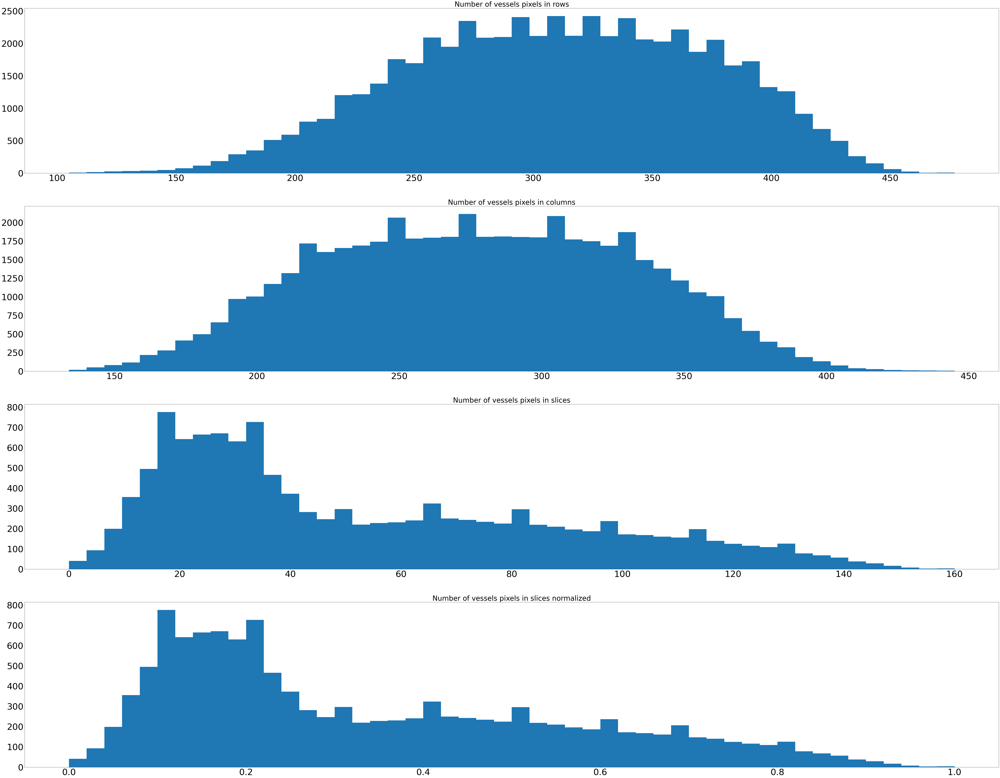

In [ ]:
#vessels plot
fig, axs = plt.subplots(4, 1, figsize =(100, 80))

axs[0].set_title('Number of vessels pixels in rows', fontsize=40)
axs[0].hist(vRows, bins=50)
axs[1].set_title('Number of vessels pixels in columns',fontsize=40)
axs[1].hist(vColumns, bins=50)
axs[2].set_title('Number of vessels pixels in slices', fontsize=40)
axs[2].hist(vSlices, bins=50)
axs[3].set_title('Number of vessels pixels in slices normalized', fontsize=40)
axs[3].hist(vSlicesNorm, bins=50)

for i in range(4):
  axs[i].tick_params(axis = 'both', which = 'major', labelsize = 50)

plt.show()

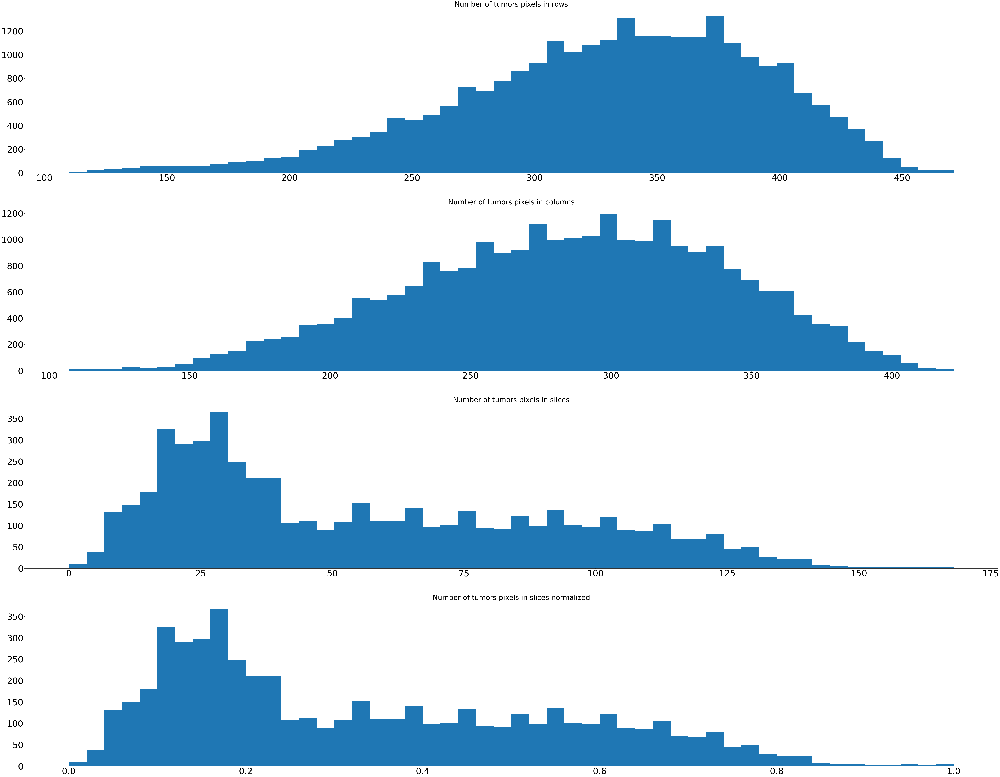

In [ ]:
#tumor plot
fig, axs = plt.subplots(4, 1, figsize =(100, 80))

axs[0].set_title('Number of tumors pixels in rows', fontsize=40)
axs[0].hist(tRows, bins=50)
axs[1].set_title('Number of tumors pixels in columns',fontsize=40)
axs[1].hist(tColumns, bins=50)
axs[2].set_title('Number of tumors pixels in slices', fontsize=40)
axs[2].hist(tSlices, bins=50)
axs[3].set_title('Number of tumors pixels in slices normalized', fontsize=40)
axs[3].hist(tSlicesNorm, bins=50)

for i in range(4):
  axs[i].tick_params(axis = 'both', which = 'major', labelsize = 50)

plt.show()

In [ ]:
import statistics
def data_range(mean, stdv):
  l = mean - 3*stdv
  r = mean + 3*stdv
  if l < 0:
    l = 0
  if r > 512:
    r = 512
  return [l, r]

vRowsStdev = statistics.stdev(vRows)
vColumnsStdev = statistics.stdev(vColumns)
vSlicesStdev = statistics.stdev(vSlices)
vRowsMean = statistics.mean(vRows)
vColumnsMean = statistics.mean(vColumns)
vSlicesMean = statistics.mean(vSlices)

tRowsStdev = statistics.stdev(tRows)
tColumnsStdev = statistics.stdev(tColumns)
tSlicesStdev = statistics.stdev(tSlices)
tRowsMean = statistics.mean(tRows)
tColumnsMean = statistics.mean(tColumns)
tSlicesMean = statistics.mean(tSlices)

vRowsRange = data_range(vRowsMean, vRowsStdev)
vColumnsRange = data_range(vColumnsMean, vColumnsStdev)
vSlicesRange = data_range(vSlicesMean, vSlicesStdev)

tRowsRange = data_range(tRowsMean, tRowsStdev)
tColumnsRange = data_range(tColumnsMean, tColumnsStdev)
tSlicesRange = data_range(tSlicesMean, tSlicesStdev)

print(vRowsRange)
print(vColumnsRange)
print(vSlicesRange)

vSlicesStdevNorm = statistics.stdev(vSlicesNorm)
vSlicesMeanNorm = statistics.mean(vSlicesNorm)

tSlicesStdevNorm = statistics.stdev(tSlicesNorm)
tSlicesMeanNorm = statistics.mean(tSlicesNorm)

vSlicesRangeNorm = data_range(vSlicesMeanNorm, vSlicesStdevNorm)
tSlicesRangeNorm = data_range(tSlicesMeanNorm, tSlicesStdevNorm)
print(vSlicesRangeNorm)

[123.25634774355103, 498.4736626773473]
[115.4394657245314, 440.1762292077316]
[0, 160.98092552591527]
[0, 1.0061307845369707]


In [ ]:
vOutOfRangeRows, vOutOfRangeColumnss, vOutOfRangeSlices, tOutOfRangeRows, tOutOfRangeColumnss, tOutOfRangeSlices = 0,0,0,0,0,0
def countOutOfRage(start, end, list):
  count = 0
  for i in list:
    if i<start or i>end:
      count += 1
  return count

vOutOfRangeRows = countOutOfRage(vRowsRange[0], vRowsRange[1], vRows)
vOutOfRangeColumnss = countOutOfRage(vColumnsRange[0], vColumnsRange[1], vColumns)
vOutOfRangeSlices = countOutOfRage(vSlicesRange[0], vSlicesRange[1], vSlices)

tOutOfRangeRows = countOutOfRage(tRowsRange[0], tRowsRange[1], tRows)
tOutOfRangeColumnss = countOutOfRage(tColumnsRange[0], tColumnsRange[1], tColumns)
tOutOfRangeSlices = countOutOfRage(tSlicesRange[0], tSlicesRange[1], tSlices)

vOutOfRangeSlicesNorm = 0
vOutOfRangeSlices = countOutOfRage(vSlicesRangeNorm[0], vSlicesRangeNorm[1], vSlicesNorm)

In [ ]:
print("number of rows pixel for vessels: ", vOutOfRangeRows)
print("number of columns pixel for vessels: ", vOutOfRangeColumnss)
print("number of slices pixel for vessels: ", vOutOfRangeSlices)

print("number of rows pixel for tumors: ",tOutOfRangeRows)
print("number of columns pixel for tumors: ",tOutOfRangeColumnss)
print("number of slices pixel for tumors: ",tOutOfRangeSlices)

number of rows pixel for vessels:  37
number of columns pixel for vessels:  5
number of slices pixel for vessels:  0
number of rows pixel for tumors:  150
number of columns pixel for tumors:  23
number of slices pixel for tumors:  4


In [ ]:
print(vOutOfRangeSlices)

0


In [ ]:
print(len())